# 1. 데이터 로딩

In [1]:
import pandas as pd

# 데이터 로딩
movies_path = '/Users/seoyeongbin/Desktop/ml-latest-small/movies.csv'
ratings_path = '/Users/seoyeongbin/Desktop/ml-latest-small/ratings.csv'

# CSV 파일에서 데이터프레임 생성
movie_df = pd.read_csv(movies_path)
ratings_df = pd.read_csv(ratings_path)

In [2]:
#데이터 확인해보기 - 겹치지 않는 영화 : 9739개
# movieId와 title 칼럼만 확인
print(f"Movie data shape: {movie_df.shape}")

# 첫 몇 행을 확인
print(movie_df.head())

# 영화 제목의 유니크한 개수 확인
print(f"Unique movie titles: {movie_df['title'].nunique()}")

Movie data shape: (9742, 3)
   movieId                               title  \
0        1                    Toy Story (1995)   
1        2                      Jumanji (1995)   
2        3             Grumpier Old Men (1995)   
3        4            Waiting to Exhale (1995)   
4        5  Father of the Bride Part II (1995)   

                                        genres  
0  Adventure|Animation|Children|Comedy|Fantasy  
1                   Adventure|Children|Fantasy  
2                               Comedy|Romance  
3                         Comedy|Drama|Romance  
4                                       Comedy  
Unique movie titles: 9737


# 2. 데이터 전처리-movie_df_clean : 중복 없는 데이터

In [3]:
# 영화 제목의 중복 여부 확인
duplicates = movie_df[movie_df.duplicated(subset='title', keep=False)]

# 중복된 제목 확인
print(f"Number of duplicate movie titles: {duplicates.shape[0]}")
print(duplicates[['movieId', 'title']].sort_values(by='title'))


Number of duplicate movie titles: 10
      movieId                                   title
4169     6003  Confessions of a Dangerous Mind (2002)
9106   144606  Confessions of a Dangerous Mind (2002)
650       838                             Emma (1996)
5601    26958                             Emma (1996)
5854    32600                             Eros (2004)
9135   147002                             Eros (2004)
2141     2851                         Saturn 3 (1980)
9468   168358                         Saturn 3 (1980)
5931    34048                War of the Worlds (2005)
6932    64997                War of the Worlds (2005)


In [4]:
# 중복된 영화 제목 제거 (첫 번째 항목만 남기고 나머지는 삭제)
movie_df_clean = movie_df.drop_duplicates(subset='title', keep='first')

# 중복 제거 후 영화 제목의 개수 확인
print(f"Cleaned movie data shape: {movie_df_clean.shape}")

# 결과 확인
movie_df_clean.head()


Cleaned movie data shape: (9737, 3)


,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [5]:
# 중복된 영화 제목이 없는지 확인
duplicate_titles_clean = movie_df_clean[movie_df_clean.duplicated(subset='title', keep=False)]

# 중복된 제목의 개수 출력
print(f"Number of duplicate movie titles after cleaning: {duplicate_titles_clean.shape[0]}")

Number of duplicate movie titles after cleaning: 0


# 3. 영화 - 영화 행렬 만들기 (동시 시청 유저 기준)


## 3-1 movie_movie_df_clean : 중복없는 영화 -영화 행렬(9737*9737)

In [6]:
import pandas as pd
import numpy as np

# 영화 제목이 중복되지 않도록 정리된 movie_df_clean을 사용
movie_titles_clean = movie_df_clean['title'].tolist()

# ratings_df에서 유저-영화 매트릭스 생성
user_movie_matrix = ratings_df.pivot_table(index='userId', columns='movieId', values='rating', aggfunc='count', fill_value=0)

# 영화-영화 행렬 초기화
num_movies = len(movie_titles_clean)
movie_movie_matrix = np.zeros((num_movies, num_movies), dtype=int)

# 각 영화의 movieId에 해당하는 인덱스를 찾는 딕셔너리
movie_id_to_index_clean = {movie_id: idx for idx, movie_id in enumerate(movie_df_clean['movieId'])}

# 유저-영화 매트릭스에서 두 영화를 동시에 본 유저를 찾고 카운트
for user_id, user_ratings in user_movie_matrix.iterrows():
    # 유저가 본 영화들
    rated_movies = user_ratings[user_ratings > 0].index.tolist()
    
    # 두 영화 모두 본 유저에 대해서만 카운트
    for i in range(len(rated_movies)):
        for j in range(i+1, len(rated_movies)):
            movie_i_id = rated_movies[i]
            movie_j_id = rated_movies[j]
            
            # 두 영화의 ID가 movie_df_clean에 존재하는지 확인
            if movie_i_id in movie_id_to_index_clean and movie_j_id in movie_id_to_index_clean:
                # 두 영화의 인덱스를 얻어 해당 위치의 값 증가
                movie_i_idx = movie_id_to_index_clean[movie_i_id]
                movie_j_idx = movie_id_to_index_clean[movie_j_id]
                
                movie_movie_matrix[movie_i_idx, movie_j_idx] += 1
                movie_movie_matrix[movie_j_idx, movie_i_idx] += 1  # 대칭 행렬이므로 반대 방향도 증가시킴

# 영화 제목을 인덱스와 컬럼으로 사용하여 데이터프레임 생성
movie_movie_df_clean = pd.DataFrame(movie_movie_matrix, index=movie_titles_clean, columns=movie_titles_clean)

# 결과 확인 (영화 제목 기반으로 영화-영화 행렬의 일부)
print(movie_movie_df_clean.head(10))  # 상위 10개 영화만 예시로 출력


                                    Toy Story (1995)  Jumanji (1995)  \
Toy Story (1995)                                   0              68   
Jumanji (1995)                                    68               0   
Grumpier Old Men (1995)                           32              26   
Waiting to Exhale (1995)                           2               3   
Father of the Bride Part II (1995)                32              22   
Heat (1995)                                       58              36   
Sabrina (1995)                                    32              18   
Tom and Huck (1995)                                5               6   
Sudden Death (1995)                               12               3   
GoldenEye (1995)                                  69              56   

                                    Grumpier Old Men (1995)  \
Toy Story (1995)                                         32   
Jumanji (1995)                                           26   
Grumpier Old Men (

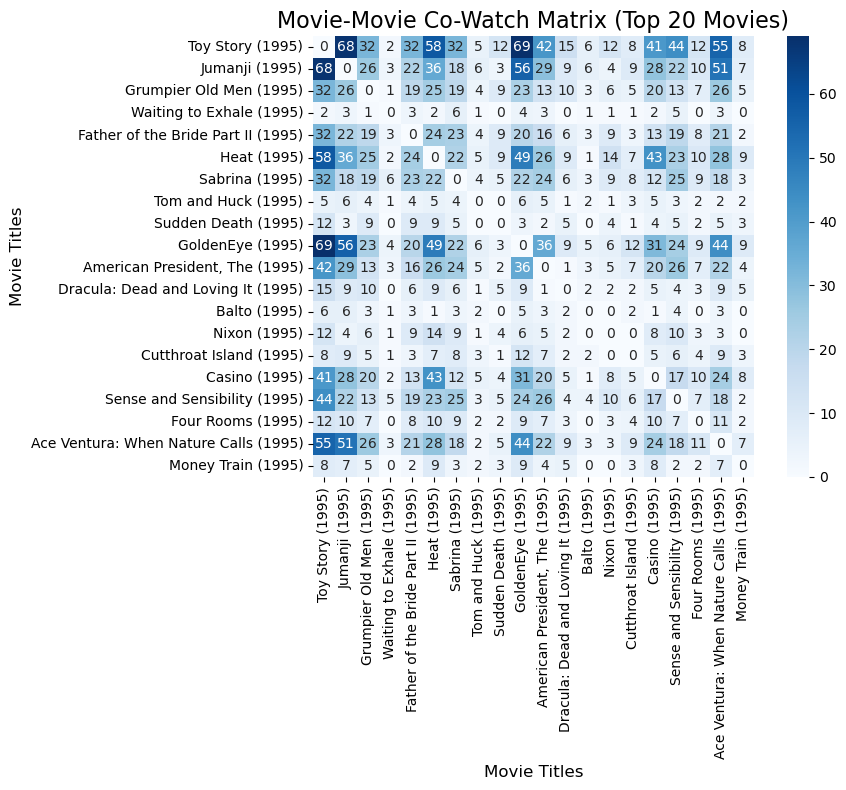

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

# 히트맵을 그리기 전에 행렬 크기가 너무 크면 일부만 시각화
# 예시로 상위 20개 영화만 사용하여 시각화
sample_movie_titles = movie_titles_clean[:20]  # 첫 20개 영화 선택

# 상위 20개 영화에 해당하는 영화-영화 행렬
sample_movie_movie_matrix = movie_movie_df_clean.loc[sample_movie_titles, sample_movie_titles]

# 히트맵 시각화
plt.figure(figsize=(10, 8))
sns.heatmap(sample_movie_movie_matrix, annot=True, fmt='d', cmap='Blues', cbar=True, square=True)
plt.title('Movie-Movie Co-Watch Matrix (Top 20 Movies)', fontsize=16)
plt.xlabel('Movie Titles', fontsize=12)
plt.ylabel('Movie Titles', fontsize=12)
plt.xticks(rotation=90)  # x축 레이블 회전
plt.yticks(rotation=0)  # y축 레이블 회전
plt.tight_layout()

# 시각화 결과 출력
plt.show()

## 3-2 pmi_matrix : movie_movie_df_clean에 pmi 적용

In [8]:
import numpy as np
from tqdm import tqdm  # 진행 상태 표시를 위한 라이브러리

# 영화-영화 행렬에서 PMI 계산 함수
def calculate_pmi(movie_movie_matrix):
    # 각 영화의 총 관람자 수 (행렬에서의 각 영화의 관람 횟수)
    movie_views = movie_movie_matrix.sum(axis=1)
    
    # 총 관람한 유저 수
    total_views = movie_movie_matrix.sum().sum()

    # PMI 행렬 초기화
    pmi_matrix = np.zeros_like(movie_movie_matrix, dtype=float)

    # tqdm을 사용하여 진행 상태 표시
    for i in tqdm(range(movie_movie_matrix.shape[0]), desc="Calculating PMI", unit="movie"):
        for j in range(i+1, movie_movie_matrix.shape[1]):  # 대칭 행렬이므로 반만 계산
            co_occurrence = movie_movie_matrix.iloc[i, j]  # 두 영화가 함께 본 유저 수
            if co_occurrence > 0:
                p_a = movie_views[i] / total_views  # 영화 A의 확률
                p_b = movie_views[j] / total_views  # 영화 B의 확률
                p_ab = co_occurrence / total_views  # 두 영화가 동시에 본 확률

                # PMI 계산
                pmi = np.log(p_ab / (p_a * p_b))
                pmi_matrix[i, j] = pmi
                pmi_matrix[j, i] = pmi  # 대칭 행렬이므로 반대 값도 동일

    return pmi_matrix

# PMI 계산
pmi_matrix = calculate_pmi(movie_movie_df_clean)

# 계산된 PMI 행렬을 확인 (상위 5개 영화만 확인)
print("PMI for top 5 movies:")
print(pmi_matrix[:5, :5])


Calculating PMI: 100%|███████████████████| 9737/9737 [10:14<00:00, 15.83movie/s]

PMI for top 5 movies:
[[0.         0.3672556  0.33028741 0.1570943  0.54343467]
 [0.3672556  0.         0.46900504 0.90891641 0.51509822]
 [0.33028741 0.46900504 0.         0.52710773 1.08529836]
 [0.1570943  0.90891641 0.52710773 0.         1.83886728]
 [0.54343467 0.51509822 1.08529836 1.83886728 0.        ]]


In [9]:
import pandas as pd
import numpy as np

# 각 영화가 몇 개의 다른 영화와 연결되었는지 출력
def count_connected_movies(movie_movie_matrix):
    # 연결된 값이 0보다 큰 (즉, 함께 본 유저가 있는) 영화 쌍의 개수를 셈
    connected_counts = np.sum(movie_movie_matrix > 0, axis=1)
    
    # 결과를 데이터프레임으로 만들어서 출력 (영화 제목과 연결된 영화의 개수)
    connected_movies = pd.DataFrame({
        'movie': movie_titles_clean,
        'connected_count': connected_counts
    })
    
    # 연결된 영화가 없는 영화만 필터링
    no_connections = connected_movies[connected_movies['connected_count'] == 0]
    
    # 모든 영화가 연결된 영화 수와 연결이 없는 영화 확인
    print(f"Total movies: {connected_movies.shape[0]}")
    print(f"Movies with no connections: {no_connections.shape[0]}")
    
    # 연결된 영화가 없는 영화들 출력 (영화 제목과 연결된 영화 수)
    print("Movies with no connections:")
    print(no_connections[['movie', 'connected_count']].head(10))  # 상위 10개 영화만 출력
    
    # 각 영화가 연결된 영화 수 출력 (상위 10개만 예시로)
    print("\nMovies with most connections:")
    print(connected_movies.sort_values(by='connected_count', ascending=False).head(10))

# 연결된 영화 개수 계산 및 출력
count_connected_movies(movie_movie_matrix)


Total movies: 9737
Movies with no connections: 18
Movies with no connections:
                                             movie  connected_count
816                          Innocents, The (1961)                0
2211                                Niagara (1953)                0
2499                        For All Mankind (1989)                0
2587  Color of Paradise, The (Rang-e khoda) (1999)                0
3118                I Know Where I'm Going! (1945)                0
4037                            Chosen, The (1981)                0
4506   Road Home, The (Wo de fu qin mu qin) (1999)                0
4598                                Scrooge (1970)                0
4704                                  Proof (1991)                0
5020                     Parallax View, The (1974)                0

Movies with most connections:
                                                  movie  connected_count
314                                 Forrest Gump (1994)             93

In [10]:
# 각 영화별 연결된 영화 개수 출력
import pandas as pd
import numpy as np

# 각 영화가 몇 개의 다른 영화와 연결되었는지 출력 (연결된 영화 개수별로)
def count_connected_movies_by_count(movie_movie_matrix):
    # 연결된 값이 0보다 큰 (즉, 함께 본 유저가 있는) 영화 쌍의 개수를 셈
    connected_counts = np.sum(movie_movie_matrix > 0, axis=1)
    
    # 각 연결된 영화 개수별로 몇 개의 영화가 있는지 집계
    connected_count_summary = pd.Series(connected_counts).value_counts().sort_index()
    
    # 결과 출력: 각 연결된 영화 개수별로 몇 개의 영화가 있는지
    for count, num_movies in connected_count_summary.items():
        print(f"{count} 개 연결된 영화: {num_movies}개")

# 연결된 영화 개수 계산 및 출력
count_connected_movies_by_count(movie_movie_matrix)

0 개 연결된 영화: 18개
20 개 연결된 영화: 5개
21 개 연결된 영화: 4개
22 개 연결된 영화: 2개
23 개 연결된 영화: 3개
24 개 연결된 영화: 1개
25 개 연결된 영화: 4개
26 개 연결된 영화: 6개
27 개 연결된 영화: 3개
28 개 연결된 영화: 3개
29 개 연결된 영화: 3개
30 개 연결된 영화: 3개
31 개 연결된 영화: 1개
32 개 연결된 영화: 3개
33 개 연결된 영화: 3개
35 개 연결된 영화: 4개
36 개 연결된 영화: 2개
37 개 연결된 영화: 1개
38 개 연결된 영화: 12개
40 개 연결된 영화: 7개
42 개 연결된 영화: 1개
43 개 연결된 영화: 4개
44 개 연결된 영화: 1개
45 개 연결된 영화: 6개
46 개 연결된 영화: 5개
47 개 연결된 영화: 1개
48 개 연결된 영화: 1개
50 개 연결된 영화: 3개
53 개 연결된 영화: 5개
55 개 연결된 영화: 2개
56 개 연결된 영화: 1개
57 개 연결된 영화: 4개
60 개 연결된 영화: 2개
61 개 연결된 영화: 2개
63 개 연결된 영화: 9개
65 개 연결된 영화: 3개
69 개 연결된 영화: 2개
70 개 연결된 영화: 1개
71 개 연결된 영화: 1개
72 개 연결된 영화: 1개
73 개 연결된 영화: 1개
74 개 연결된 영화: 2개
75 개 연결된 영화: 3개
80 개 연결된 영화: 4개
81 개 연결된 영화: 1개
82 개 연결된 영화: 8개
83 개 연결된 영화: 1개
84 개 연결된 영화: 3개
85 개 연결된 영화: 2개
86 개 연결된 영화: 2개
88 개 연결된 영화: 1개
92 개 연결된 영화: 4개
93 개 연결된 영화: 1개
94 개 연결된 영화: 3개
99 개 연결된 영화: 5개
100 개 연결된 영화: 1개
101 개 연결된 영화: 1개
102 개 연결된 영화: 6개
105 개 연결된 영화: 1개
106 개 연결된 영화: 3개
111 개 연결된 영화: 11개
112 개 연결된 영화: 2개

## 3-3. 연결된 영화 0개인 영화 지우기 : movie_movie_matrix_cleaned ,pmi_matrix_cleaned

In [11]:
import numpy as np
import pandas as pd

# 0개 연결된 영화 찾기
def get_movies_with_no_connections(movie_movie_matrix):
    # 연결된 영화가 하나도 없는 영화 찾기
    connected_counts = np.sum(movie_movie_matrix > 0, axis=1)
    no_connection_movies = np.where(connected_counts == 0)[0]
    return no_connection_movies

# 0개 연결된 영화를 제외한 새로운 영화-영화 행렬 생성
def create_matrix_without_no_connection_movies(movie_movie_matrix):
    # 0개 연결된 영화들의 인덱스 얻기
    no_connection_movies = get_movies_with_no_connections(movie_movie_matrix)
    
    # 0개 연결된 영화 제외한 행렬 생성
    movie_movie_matrix_cleaned = np.delete(movie_movie_matrix, no_connection_movies, axis=0)
    movie_movie_matrix_cleaned = np.delete(movie_movie_matrix_cleaned, no_connection_movies, axis=1)
    
    return movie_movie_matrix_cleaned

# 0개 연결된 영화 제외한 행렬 생성
movie_movie_matrix_cleaned = create_matrix_without_no_connection_movies(movie_movie_matrix)

# 결과 확인: 행렬 크기
print(f"Original movie-movie matrix shape: {movie_movie_matrix.shape}")
print(f"Cleaned movie-movie matrix shape: {movie_movie_matrix_cleaned.shape}")

Original movie-movie matrix shape: (9737, 9737)
Cleaned movie-movie matrix shape: (9719, 9719)


In [12]:
import numpy as np

# 0개 연결된 영화 찾기
def get_movies_with_no_connections(movie_movie_matrix):
    # 연결된 영화가 하나도 없는 영화 찾기
    connected_counts = np.sum(movie_movie_matrix > 0, axis=1)
    no_connection_movies = np.where(connected_counts == 0)[0]
    return no_connection_movies

# 0개 연결된 영화 제외한 새로운 PMI 행렬 생성
def create_pmi_matrix_without_no_connection_movies(pmi_matrix, movie_movie_matrix):
    # 0개 연결된 영화들의 인덱스 얻기
    no_connection_movies = get_movies_with_no_connections(movie_movie_matrix)
    
    # 0개 연결된 영화 제외한 PMI 행렬 생성
    pmi_matrix_cleaned = np.delete(pmi_matrix, no_connection_movies, axis=0)
    pmi_matrix_cleaned = np.delete(pmi_matrix_cleaned, no_connection_movies, axis=1)
    
    return pmi_matrix_cleaned

# 0개 연결된 영화 제외한 PMI 행렬 생성
pmi_matrix_cleaned = create_pmi_matrix_without_no_connection_movies(pmi_matrix, movie_movie_matrix)

# 결과 확인: 행렬 크기
print(f"Original PMI matrix shape: {pmi_matrix.shape}")
print(f"Cleaned PMI matrix shape: {pmi_matrix_cleaned.shape}")

Original PMI matrix shape: (9737, 9737)
Cleaned PMI matrix shape: (9719, 9719)



# 4. 시퀀스 생성하기 : sequences

In [13]:
import numpy as np
import pandas as pd

# 영화 제목 기반으로 시퀀스를 생성하는 함수
def generate_sequences_nearest_w_pmi_titles(pmi_matrix_cleaned, movie_titles, window_size=20):
    sequences = []
    
    # 각 영화 제목에 대해 PMI 값이 큰 상위 w개 영화 찾기
    for movie_idx in range(pmi_matrix_cleaned.shape[0]):
        movie_title = movie_titles[movie_idx]  # 영화 제목
        movie_pmi = pmi_matrix_cleaned[movie_idx]  # 해당 영화와 다른 영화들의 PMI 값
        
        # PMI 값이 큰 순서대로 정렬 (내림차순)
        sorted_movies = np.argsort(movie_pmi)[::-1]  # 내림차순 정렬
        
        # 자기 자신 제외하고 상위 w개 영화 선택
        top_w_movies = sorted_movies[sorted_movies != movie_idx][:window_size]
        
        # 상위 w개 영화 제목 선택
        top_w_movie_titles = [movie_titles[neighbor_idx] for neighbor_idx in top_w_movies]
        
        # 시퀀스에 추가 (영화 제목)
        sequences.append((movie_title, top_w_movie_titles))
    
    return sequences

# 예시로, 상위 20개 제목을 선택하는 시퀀스를 생성
window_size = 20

# 영화 제목 리스트
movie_titles = movie_df['title'].tolist()  # movie_df는 영화 데이터프레임

# 시퀀스 생성
sequences = generate_sequences_nearest_w_pmi_titles(pmi_matrix_cleaned, movie_titles, window_size)

# 결과 확인 (영화 제목 기반으로 시퀀스)
for seq in sequences:
    print(f"Movie '{seq[0]}' - Nearest Neighbors: {', '.join(seq[1])}")

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [14]:
sequences

[('Toy Story (1995)',
  ['Once Upon a Time... When We Were Colored (1995)',
   'Thin Line Between Love and Hate, A (1996)',
   'The True Memoirs of an International Assassin (2016)',
   'Turbo Kid (2015)',
   'Oz the Great and Powerful (2013)',
   'Mina Tannenbaum (1994)',
   'For the Birds (2000)',
   'Man of the Year (1995)',
   'Avengers: Infinity War - Part I (2018)',
   'Sunset Park (1996)',
   'Volcano (1997)',
   'Mrs. Dalloway (1997)',
   '1-900 (06) (1994)',
   'Cry, the Beloved Country (1995)',
   'Funeral, The (1996)',
   'Last Klezmer: Leopold Kozlowski, His Life and Music, The (1994)',
   'Monty Python and the Holy Grail (1975)',
   'Entertaining Angels: The Dorothy Day Story (1996)',
   'Power Rangers (2017)',
   'Fever Pitch (1997)']),
 ('Jumanji (1995)',
  ['Furious 7 (2015)',
   'New York, New York (1977)',
   'Girl Walks Home Alone at Night, A (2014)',
   'Beyond Bedlam (1993)',
   'Frisk (1995)',
   'Castle Freak (1995)',
   'Relative Fear (1994)',
   "Young Poisoner

In [15]:
# 시퀀스 개수 확인
print(f"Total sequences generated: {len(sequences)}")

Total sequences generated: 9719


In [16]:
# movie_movie_matrix_cleaned의 크기를 확인하고, 해당 인덱스에 맞는 영화 제목만 추출
movie_titles_cleaned = [movie_titles[i] for i in range(len(movie_titles)) if i < movie_movie_matrix_cleaned.shape[0]]

# 결과 확인
print(f"Number of cleaned movie titles: {len(movie_titles_cleaned)}")
print(f"First 5 cleaned movie titles: {movie_titles_cleaned[:5]}")

Number of cleaned movie titles: 9719
First 5 cleaned movie titles: ['Toy Story (1995)', 'Jumanji (1995)', 'Grumpier Old Men (1995)', 'Waiting to Exhale (1995)', 'Father of the Bride Part II (1995)']


In [17]:
import pandas as pd

# movie_titles_cleaned를 DataFrame으로 변환
movie_titles_cleaned_df = pd.DataFrame(movie_titles_cleaned, columns=['title'])

# movie_titles_cleaned_df를 인덱스와 제목으로 구성된 새로운 DataFrame
movie_titles_cleaned_df['index'] = movie_titles_cleaned_df.index

# 결과 확인
print(movie_titles_cleaned_df.head())


                                title  index
0                    Toy Story (1995)      0
1                      Jumanji (1995)      1
2             Grumpier Old Men (1995)      2
3            Waiting to Exhale (1995)      3
4  Father of the Bride Part II (1995)      4


In [18]:
print(len(movie_titles_cleaned_df))

9719


# 5. skip-gram 학습

In [19]:
# 영화 제목을 표준화하는 함수
def preprocess_movie_title(title):
    return title.strip().replace('(', '').replace(')', '').replace(' ', '_')

# 1. 각 시퀀스를 단어 리스트로 변환
# `sequences`는 (영화 제목, [상위 w개 영화 제목들]) 형태로 변환
sequences_for_training = []
for movie_title, top_w_movie_titles in sequences:
    # 영화 제목을 표준화하여 단어 리스트로 변환
    processed_movie_title = preprocess_movie_title(movie_title)
    processed_top_w_movie_titles = [preprocess_movie_title(title) for title in top_w_movie_titles]
    
    # [중심 영화] + [주변 영화들] 형태로 변환
    sequences_for_training.append([processed_movie_title] + processed_top_w_movie_titles)


In [20]:
from gensim.models import Word2Vec

# 영화 제목을 표준화하는 함수
def preprocess_movie_title(title):
    return title.strip().replace('(', '').replace(')', '').replace(' ', '_')

# 1. 각 시퀀스를 단어 리스트로 변환
# `sequences`는 (영화 제목, [상위 w개 영화 제목들]) 형태로 변환
sequences_for_training = []
for movie_title, top_w_movie_titles in sequences:
    # 영화 제목을 표준화하여 단어 리스트로 변환
    processed_movie_title = preprocess_movie_title(movie_title)
    processed_top_w_movie_titles = [preprocess_movie_title(title) for title in top_w_movie_titles]
    
    # [중심 영화] + [주변 영화들] 형태로 변환
    sequences_for_training.append([processed_movie_title] + processed_top_w_movie_titles)

# 2. Word2Vec 모델 학습
skipgram_model = Word2Vec(sentences=sequences_for_training, 
                           vector_size=100,   # 임베딩 차원
                           window=10,          # 주변 단어 범위
                           min_count=1,       # 최소 등장 횟수
                           sg=1,              # Skip-gram 방식 사용
                           workers=4)         # 학습에 사용할 CPU 코어 수

# 3. 학습된 모델에서 특정 영화 임베딩 추출 함수
def get_movie_embedding(model, movie_title):
    # 영화 제목을 표준화한 후 모델에서 임베딩 추출
    standardized_title = preprocess_movie_title(movie_title)
    if standardized_title in model.wv:
        return model.wv[standardized_title]
    else:
        print(f"'{movie_title}' not found in the model.")
        return None

# 4. 모든 영화에 대해 임베딩 추출 및 출력
for movie_title in movie_titles:
    embedding = get_movie_embedding(skipgram_model, movie_title)
    
    if embedding is not None:
        print(f"Embedding for '{movie_title}':")
        print(embedding)

Embedding for 'Toy Story (1995)':
[-1.08424313e-01  3.47800441e-02  2.95652356e-02  1.00633493e-02
  3.62972580e-02 -2.78878044e-02 -4.62930277e-02  8.42822343e-02
 -1.70555227e-02  3.14541273e-02 -8.28222483e-02 -5.31925671e-02
 -9.08489805e-03 -1.05827197e-01  1.05449315e-02 -1.00066714e-01
 -1.33086219e-02 -2.56693922e-02  1.41661078e-01 -1.91583261e-02
 -1.90908760e-02 -9.21908617e-02 -2.78375801e-02 -6.74705952e-02
  8.35252553e-02  9.68891755e-02 -9.15770456e-02  1.38343992e-02
  4.80361991e-02 -7.15275556e-02 -1.56888813e-02  8.16093292e-03
  2.08694651e-03 -1.57375261e-02 -1.07422164e-02 -1.18693616e-02
 -1.68045971e-03  1.10123809e-02  7.21248239e-03  3.30773219e-02
 -2.93456800e-02  2.98555829e-02 -1.33079095e-02  5.11746015e-03
  8.06696415e-02 -2.18247175e-01  2.52307709e-02  4.22548242e-02
 -2.91549452e-02 -1.02754608e-02  2.47685350e-02  7.71143287e-02
  4.24080566e-02  4.69526052e-02 -9.68562067e-02  3.43498886e-02
  6.49281591e-02  2.12600492e-02 -4.75186780e-02  3.5527

[-0.06291461 -0.04280981  0.01555074 -0.0186275  -0.04200894 -0.10640677
  0.04820007  0.0373021   0.00931593  0.02093396 -0.0829277   0.00020792
 -0.0769956  -0.12167885  0.00347085 -0.07669915 -0.0573446  -0.14115189
  0.0173357   0.03563852 -0.00814744 -0.00459697  0.01747759 -0.02146076
  0.14302233  0.09213936 -0.04462269 -0.02421335  0.02697924 -0.00796208
  0.03506923 -0.00866942 -0.02198449 -0.04942908  0.00324478 -0.02942839
  0.02563287 -0.10315775  0.04063895 -0.11271237 -0.08127229  0.02052465
  0.00099044  0.00955424  0.08048115 -0.13196258 -0.00803078 -0.03664762
 -0.03743802  0.00389585  0.10992847  0.05462062  0.02453365  0.00268424
 -0.10669202  0.01151962  0.01138058  0.07022183 -0.0689778   0.01137923
  0.05162678 -0.02573172 -0.00220111  0.06272118 -0.0442568  -0.00956597
 -0.07498468  0.04421014 -0.02193765  0.0801788  -0.01131671  0.03876683
 -0.05644642  0.0015819   0.07914598  0.00285281 -0.09256139  0.03643823
  0.03087334  0.0392192  -0.0512316  -0.07493839 -0

[-0.16467945  0.07350287 -0.01692222  0.0076103   0.05245899 -0.06864774
 -0.09061899  0.09687993 -0.07262252  0.01529163 -0.13576376 -0.07916665
 -0.0184904  -0.13348196  0.02282374 -0.13350905 -0.01240775 -0.08579445
  0.14979073  0.01411516 -0.05892966 -0.1663238  -0.03349361 -0.08859931
  0.12338373  0.13894033 -0.10254158  0.00354066  0.06750415 -0.08741077
 -0.05723889  0.00532598  0.00911654 -0.03410874  0.0196037  -0.01895984
 -0.00086737 -0.03892229  0.03050707 -0.01735525 -0.05114705  0.03691894
 -0.02634422 -0.0398974   0.18355374 -0.2967948   0.08770678  0.04037573
 -0.04129189 -0.06520663  0.05469617  0.09595776  0.02575794  0.08925658
 -0.20577355  0.07091071  0.13477631  0.05215348 -0.06580899  0.01985225
  0.02693039 -0.14060618 -0.07786734  0.04255348 -0.02417044 -0.0270832
 -0.23468992 -0.01035495  0.01358237  0.15208934  0.00173998 -0.02511139
 -0.14583667  0.00953701  0.17058899  0.03346858 -0.1353247   0.00774626
  0.06305849  0.03067444 -0.00579241 -0.01891435 -0.

[-0.04806998  0.03154837 -0.04153008 -0.009364   -0.03676661 -0.010274
 -0.07741806  0.08400369 -0.09739504  0.00922382 -0.11737161 -0.02302968
  0.02778584 -0.11102252 -0.00954453 -0.03597952  0.02533795 -0.02396545
  0.01356561 -0.00304814 -0.07192843 -0.16391164 -0.02826333 -0.1233881
  0.05105389  0.03925353 -0.06445413 -0.04012439 -0.00544818 -0.11043474
 -0.01894192  0.00660645  0.02712021  0.00041597 -0.04902906 -0.01710645
  0.05366502 -0.06030083  0.00177326 -0.00515453 -0.00518501  0.09753986
 -0.01681855 -0.04878422  0.1016534  -0.15931346  0.04668659  0.02028941
 -0.09404743 -0.05706898  0.05411148  0.05008754  0.06276873  0.08506133
 -0.12755932  0.09119231  0.08878054  0.0417998  -0.04571514  0.0331544
  0.00747777 -0.0786901   0.00577427 -0.03937134 -0.05910606 -0.05839691
 -0.12431998  0.03717933  0.01626352  0.08626387 -0.00769376 -0.00658932
 -0.12047449  0.00717186  0.08600661  0.01764835 -0.06887602 -0.02737187
  0.02867979  0.05164339  0.02894172  0.01028359 -0.104

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-1.27068534e-01  5.19431755e-03 -7.11030364e-02 -9.98700503e-03
  1.15639277e-01 -5.35697117e-02 -2.06152536e-02  1.13868646e-01
 -2.99135074e-02  8.47189352e-02 -1.12403095e-01 -1.17158294e-01
  9.97704733e-03 -8.55383351e-02  2.52826530e-02 -3.19826789e-02
 -4.31748517e-02 -4.60840389e-02  1.14613809e-01 -4.59146351e-02
 -6.93083778e-02 -1.03855841e-01  1.86308548e-02 -5.81857786e-02
  6.64344728e-02  1.19598545e-01 -3.81388292e-02 -2.11984254e-02
  3.69775742e-02 -4.73532155e-02 -4.92348522e-02  1.23893386e-02
  2.74725072e-02 -1.57744121e-02 -3.27346325e-02  6.98945448e-02
 -4.65650372e-02 -3.65855880e-02 -1.02776848e-03  5.14747053e-02
  3.72427478e-02  5.68560399e-02 -7.94319436e-02 -1.30986601e-01
  7.02196732e-02 -1.62211865e-01  4.62444760e-02  5.94418161e-02
 -5.29672317e-02 -1.23774678e-01 -1.67818554e-02  2.50530709e-02
  7.53601119e-02  5.85754439e-02 -1.59417480e-01  7.81957135e-02
  3.76427546e-02  6.65900589e-04 -6.35847524e-02  9.58974008e-03
 -8.94841389e-04 -1.49997

[-0.2189554  -0.12747198 -0.02978183  0.03396402 -0.0457546  -0.22973378
 -0.04013377  0.10222575 -0.15297897 -0.35615012 -0.27122602 -0.16321614
 -0.3524988  -0.09474739  0.05022152 -0.2616049  -0.30562663 -0.16013181
  0.17389123  0.04126816 -0.09336848 -0.11460515  0.02970166 -0.07813215
  0.13347301  0.1410715  -0.2003793  -0.03935133 -0.12210646  0.06587571
 -0.19598874  0.0696454  -0.08879927 -0.08669709  0.27008554 -0.22310689
 -0.02759916 -0.00796411  0.11215274 -0.31746224 -0.10924369 -0.03554618
 -0.03475323 -0.31937987  0.32840332 -0.34383723  0.32121518  0.09342357
  0.07851429 -0.16073228 -0.01776154 -0.07480901 -0.16072592 -0.08157431
 -0.3987357   0.20403199  0.1642105   0.1426005   0.02881472 -0.03642156
  0.0741815  -0.11205132 -0.0048425  -0.14463174 -0.09166867 -0.04258736
 -0.19973761 -0.05285458 -0.14981796  0.30521324 -0.05737152 -0.07618152
 -0.17438418  0.26957446  0.31913537 -0.03437746 -0.15410978  0.10233106
 -0.1507838   0.02150357  0.02440102 -0.01745761 -0

[-0.81249774 -0.15521297  0.02318385  0.5770219  -0.35783753 -0.48247066
  0.00245436  0.33756113  0.33706245  0.35130304 -0.6276843  -0.29716188
 -0.37853134 -0.87558967 -0.1520102  -0.47279572 -0.63427246 -0.74209374
  0.50887614 -0.08344654  0.08801959  0.17419454  0.6076391  -0.6572839
  0.1786321   0.4071706   0.26241946 -0.04429372  0.38719803  0.08193687
  0.24537738 -0.14537276 -0.21494576 -0.30015332  0.14307003  0.1638426
 -0.62332046 -0.2996975  -0.30986404 -0.6541939  -0.40742669  0.10285586
 -0.5633683  -0.6557649   0.10014907 -0.2656075   0.52270937  0.26756233
  0.497301   -0.08079197 -0.11566188  0.38417494  0.6796554  -0.13653815
 -0.75354147  0.18712191  0.17021732  0.48119655 -0.35730314  0.15918374
 -0.05861435 -0.7615185  -0.20644364  0.1636757  -0.11996731  0.17898425
 -0.57507175 -0.20027693 -0.5271609   1.3286172  -0.710822    0.06217221
 -0.51344377  0.18493065  0.6097909   0.35051167 -0.04290094  0.13631612
  0.5037421  -0.132589   -0.37097928 -0.33761218 -0.5

[-0.7309178  -0.24560012 -0.4382433  -0.3244238   0.29868802 -1.093316
 -0.1373293   1.0416528  -0.25147384  0.22251904 -0.07071685 -0.00311089
  0.3581003  -0.6160764  -0.3374887  -0.54121655 -0.09293115 -0.5351667
  0.14408417 -0.78138065 -0.04254966 -0.00734304 -0.0871342  -0.48478988
  0.19341813  0.28280488 -0.2387061  -0.4799801  -0.11913317 -0.32674468
  0.2871901  -0.39709932  0.04173195 -0.33908275  0.07118104  0.67114615
 -0.4756748  -0.6396061   0.23856975 -0.38803962 -0.5293572   0.26134425
  0.10499626 -0.05216449  0.26548895 -0.02907785 -0.22469905  0.2359686
  0.3521455   0.0752202   0.13012208  0.53408617 -0.04073578 -0.1003523
 -0.77674586  0.64126533  0.35747296  0.13752173  0.10613609  0.32447618
 -0.06186834 -0.39433825 -0.26113504 -0.665994    0.06423502  0.22882204
 -0.310592   -0.08207203 -0.63383603  0.8147415  -0.9273832  -0.08194672
 -0.8556273   0.29254362  0.38258544 -0.0503214  -0.7965285  -0.30601385
  0.5164602   0.42473647  0.04896557  0.31632915 -1.0715

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [21]:
# movie_titles_cleaned의 제목을 기준으로 임베딩되지 않은 영화 찾기
missing_movies = []
for title in movie_titles_cleaned:
    standardized_title = preprocess_movie_title(title)
    if standardized_title not in skipgram_model.wv:
        missing_movies.append(title)

# 누락된 영화 개수 출력
print(f"Number of missing movies: {len(missing_movies)}")

# 누락된 영화 제목 출력 (원한다면 일부 출력)
print(f"Missing movies: {missing_movies[:10]}")  # 첫 10개만 출력

Number of missing movies: 0
Missing movies: []


In [22]:
# 1. 각 영화의 임베딩을 뽑아서 출력
for movie_title in movie_titles_cleaned:
    embedding = get_movie_embedding(skipgram_model, movie_title)
    
    if embedding is not None:
        print(f"Embedding for '{movie_title}':")
        print(embedding)
        print("-" * 50)  # 구분선

Embedding for 'Toy Story (1995)':
[-1.08424313e-01  3.47800441e-02  2.95652356e-02  1.00633493e-02
  3.62972580e-02 -2.78878044e-02 -4.62930277e-02  8.42822343e-02
 -1.70555227e-02  3.14541273e-02 -8.28222483e-02 -5.31925671e-02
 -9.08489805e-03 -1.05827197e-01  1.05449315e-02 -1.00066714e-01
 -1.33086219e-02 -2.56693922e-02  1.41661078e-01 -1.91583261e-02
 -1.90908760e-02 -9.21908617e-02 -2.78375801e-02 -6.74705952e-02
  8.35252553e-02  9.68891755e-02 -9.15770456e-02  1.38343992e-02
  4.80361991e-02 -7.15275556e-02 -1.56888813e-02  8.16093292e-03
  2.08694651e-03 -1.57375261e-02 -1.07422164e-02 -1.18693616e-02
 -1.68045971e-03  1.10123809e-02  7.21248239e-03  3.30773219e-02
 -2.93456800e-02  2.98555829e-02 -1.33079095e-02  5.11746015e-03
  8.06696415e-02 -2.18247175e-01  2.52307709e-02  4.22548242e-02
 -2.91549452e-02 -1.02754608e-02  2.47685350e-02  7.71143287e-02
  4.24080566e-02  4.69526052e-02 -9.68562067e-02  3.43498886e-02
  6.49281591e-02  2.12600492e-02 -4.75186780e-02  3.5527

[-0.13916355  0.01943331 -0.01843169 -0.03058686 -0.01542585 -0.03085445
 -0.0683163   0.08689409 -0.01224865  0.00285074 -0.14115229 -0.04447961
  0.0092126  -0.16789801 -0.00705822 -0.17516226  0.04846675 -0.09588361
  0.1987105   0.02388936 -0.03359035 -0.19687052 -0.12616542 -0.08867846
  0.1644159   0.11332607 -0.13383651 -0.01408823  0.03103413 -0.1084616
 -0.02628045  0.00752877 -0.0463829  -0.04825746 -0.03533489 -0.01709884
  0.0354107  -0.02508167  0.00517477  0.02110918 -0.08849362  0.04395906
 -0.0065664   0.00877283  0.18281001 -0.29732937  0.0701552   0.0293666
 -0.08536134 -0.05295108  0.09704559  0.13931045  0.04346592  0.09203077
 -0.16510712  0.10655678  0.19043033  0.04059416 -0.06465206 -0.020834
  0.07948033 -0.1043699  -0.06778304  0.05584526 -0.01503226 -0.10750577
 -0.28331932 -0.03077462  0.04343182  0.13656703  0.04304231  0.07408211
 -0.13730744 -0.04312422  0.13286783  0.069957   -0.16214938  0.00859552
  0.07959189  0.00092903  0.02369718 -0.0466582  -0.140

[-0.09851981  0.12215403 -0.05788242 -0.07866758  0.01035038 -0.01053203
 -0.17331575  0.14549631 -0.05142215  0.02853849 -0.15555766 -0.07678853
 -0.03010726 -0.1309945  -0.06292843 -0.14305799  0.09257586 -0.0044934
  0.1771282   0.04093962 -0.00481884 -0.22306116 -0.18098564 -0.07821766
  0.15189826  0.19178493 -0.23202114  0.01614931  0.06655531 -0.09662057
 -0.13745593 -0.0281465  -0.02355773 -0.04188053 -0.00586488 -0.0677603
  0.04864004 -0.0320165  -0.0311199   0.01194073 -0.06900198  0.0169972
  0.01320976 -0.07205573  0.25152874 -0.29225773  0.11748974  0.00816776
 -0.10656977 -0.09191344  0.12666549  0.07654952  0.03891756  0.02399967
 -0.14951275  0.13630599  0.21821111  0.09026532 -0.05023719  0.02872399
  0.047012    0.01451715 -0.0580266   0.07787097 -0.04567675 -0.2138068
 -0.2878637  -0.08503917  0.08085395  0.17401564  0.06195014 -0.01902167
 -0.12367765 -0.13677388  0.12455136  0.06825195 -0.1386865   0.08765126
  0.09542114 -0.04084517  0.04692139 -0.18529291 -0.119

[-0.12079732  0.09623198  0.00501642 -0.01903098  0.04177477 -0.01452713
 -0.0272806   0.09036308 -0.05654488  0.00390721 -0.12763102 -0.10147102
 -0.03528633 -0.13456844  0.00467459 -0.07768293 -0.04728699 -0.04912632
  0.11871813  0.0008057  -0.01972504 -0.12142209 -0.04998413 -0.06704324
  0.0565004   0.10765144 -0.09380297 -0.00364278  0.03525371 -0.04736916
 -0.07196471 -0.00704499  0.01718868 -0.02393745 -0.04032248 -0.05218782
  0.03049136  0.01492539  0.03322145 -0.05993884  0.00703351  0.07447037
 -0.00414318 -0.03834191  0.11428306 -0.27677318  0.11969344  0.02575893
 -0.03810822 -0.04523946  0.03817355  0.063181    0.00308877  0.06098027
 -0.11447703  0.06723327  0.09228887  0.07001603 -0.03262002  0.0222727
  0.03880778 -0.09287477 -0.07743698  0.01600286 -0.04344473 -0.02736315
 -0.16679211 -0.02731271  0.06309418  0.14214543  0.05844519 -0.02994597
 -0.09918773  0.04779172  0.09598827  0.00913271 -0.09407236  0.02108802
  0.04281239 -0.04207537 -0.00847966 -0.01491146 -0.

[-0.13856232  0.07188677  0.02268878 -0.06750946 -0.11974782 -0.43635446
  0.00600117  0.12064803  0.06645492  0.15265498 -0.05098966 -0.02727625
 -0.2548954  -0.20169035 -0.03827428 -0.19326137 -0.20608439 -0.53227526
  0.11699181  0.16688575 -0.09986558  0.12504809  0.01465723 -0.09504737
  0.22903754  0.05552568 -0.04050525  0.01134471  0.04783075 -0.07000652
  0.21920224 -0.09264722 -0.14019991 -0.16915628 -0.1344703   0.06979439
 -0.09628171 -0.17846668  0.21145342 -0.50549227 -0.37874728 -0.1368929
 -0.1069969   0.1062781   0.3652804  -0.07017121 -0.15659773 -0.03558045
 -0.0677798  -0.08320641  0.2706052   0.28084517 -0.23677169 -0.07071506
 -0.20352006  0.01504997  0.13156603  0.2181617  -0.22794646 -0.1384
 -0.08524817 -0.11789389  0.08884319  0.03100864  0.17608659 -0.1579194
 -0.24421515  0.04069782 -0.3112599   0.15647335 -0.07652961 -0.0165792
 -0.289869   -0.1497972   0.26372224 -0.08770337 -0.29317153  0.05540068
  0.00617804  0.08207602 -0.05109271 -0.04132818 -0.313553

[-0.04806998  0.03154837 -0.04153008 -0.009364   -0.03676661 -0.010274
 -0.07741806  0.08400369 -0.09739504  0.00922382 -0.11737161 -0.02302968
  0.02778584 -0.11102252 -0.00954453 -0.03597952  0.02533795 -0.02396545
  0.01356561 -0.00304814 -0.07192843 -0.16391164 -0.02826333 -0.1233881
  0.05105389  0.03925353 -0.06445413 -0.04012439 -0.00544818 -0.11043474
 -0.01894192  0.00660645  0.02712021  0.00041597 -0.04902906 -0.01710645
  0.05366502 -0.06030083  0.00177326 -0.00515453 -0.00518501  0.09753986
 -0.01681855 -0.04878422  0.1016534  -0.15931346  0.04668659  0.02028941
 -0.09404743 -0.05706898  0.05411148  0.05008754  0.06276873  0.08506133
 -0.12755932  0.09119231  0.08878054  0.0417998  -0.04571514  0.0331544
  0.00747777 -0.0786901   0.00577427 -0.03937134 -0.05910606 -0.05839691
 -0.12431998  0.03717933  0.01626352  0.08626387 -0.00769376 -0.00658932
 -0.12047449  0.00717186  0.08600661  0.01764835 -0.06887602 -0.02737187
  0.02867979  0.05164339  0.02894172  0.01028359 -0.104

[-0.07330313  0.06692769  0.04185909  0.00601668 -0.00646682 -0.05398374
 -0.07635489  0.09004875 -0.04403322  0.05066033 -0.09134733 -0.04350176
 -0.00310548 -0.09951977  0.00245212 -0.06193    -0.01566812 -0.0547853
  0.08796296 -0.00869179 -0.01791742 -0.09309496 -0.02830012 -0.05518162
  0.02412746  0.0956625  -0.06736292 -0.05053067  0.03871223 -0.06701807
  0.00216095  0.00422388  0.03676542  0.0207217  -0.02846098 -0.02764627
 -0.00958503 -0.06513669  0.00082319 -0.02050285 -0.02398258  0.03730556
 -0.0121044   0.0032798   0.0864175  -0.16645864  0.00822024  0.05204649
  0.00562407 -0.02528268  0.06638568  0.09090795  0.00247082  0.03245763
 -0.12158015  0.06742626  0.12161162  0.07062767 -0.05998868 -0.0259996
  0.03614758 -0.05761493 -0.08921832  0.03115086 -0.03300067 -0.03286999
 -0.10942028 -0.00787066  0.00303751  0.10499788 -0.00125495 -0.02533409
 -0.10261948  0.03104667  0.09692765  0.07147402 -0.06184076 -0.02529357
  0.05086939  0.03257577  0.02108592  0.01536462 -0.1

[-0.08236957  0.48612988  0.5794439  -0.04552397  0.1271573  -0.6031684
  0.16633846  0.32221338  0.08899411  0.33169007 -0.09763835  0.06201088
 -0.7449008  -0.19958638  0.0659141  -0.41464683 -0.5899679  -0.58541083
 -0.2132508   0.48871318  0.20069414 -0.13790067 -0.03229942 -0.02276982
  0.4351735   0.5021426  -0.33961895 -0.5972402  -0.04236193  0.41673154
  0.39093167 -0.1223667  -0.10626341  0.11742228 -0.20862617  0.3477756
  0.08737426 -0.89783376  0.22863525 -0.99580514 -0.03737926 -0.32891864
  0.08279248  0.68938774  0.6689273  -0.3571552  -0.44759688 -0.48436615
 -0.33051088 -0.05210623  0.57679576  0.5621059   0.17917123  0.09963231
 -0.4063334  -0.15907319  0.20642708  0.57450515 -0.3234743  -0.16179018
  0.16833155  0.09972726 -0.06308324  0.06441652 -0.08281915 -0.22889161
 -0.40674356  0.2822572   0.0935695   0.21411297 -0.18143958 -0.46829507
 -0.34665355  0.13302319  0.2194452   0.15228848 -0.52788496  0.00472217
 -0.3303372   0.16586307 -0.19236201 -0.2674822  -0.9

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.8201736   0.2130943   0.3465445  -0.4078187   0.5049236   0.15159108
  0.22353756 -0.1119938   0.6135983  -0.30518097 -0.39608452 -0.46740496
  0.05553384 -0.7637146   0.09272923 -0.7384425  -0.23898928  0.12810431
  0.79707164  0.52158356 -0.04614175 -0.5680503  -0.07561828 -0.08847963
  0.3435255   0.73994154 -0.04605856  0.44382682 -0.47858655 -0.7529643
  0.07541174  0.48619488  0.01095088 -0.10982878  0.1531221   0.3365579
  0.03884284  0.15118887 -0.02373247  0.05270064 -0.12140083 -0.17941207
 -0.02797381 -0.23651992  0.9234402  -1.0429158  -0.8386226  -0.25061604
 -0.43525016  0.23770349  0.1067254   0.53945804  0.22324401  0.55314326
 -0.6372496   0.3090863  -0.5974045  -0.07120845 -0.40163967  0.3640816
  0.04370394 -0.09945574  0.01273668 -0.2136868   0.61456746 -0.01422276
 -0.7946295   0.6963349   0.14467494  0.32423022  0.21625525  0.4481313
 -0.08958283  0.13979468  0.45356256 -0.39121372 -0.33278567  0.5443523
  0.13989758  0.06447743 -0.4522216  -0.5212851  -0.5588

[-0.05866646  0.24637637 -0.9368232  -0.07756256  0.12032272 -0.32802904
 -0.5049019   0.5316586  -0.36339086  0.22821651 -0.65684354 -0.16201866
  0.25009677  0.05462004  0.307399   -0.30475494  0.4190663  -0.01252732
  0.16896743 -0.26777956 -0.28932822 -0.40618303  0.18093327 -0.22746818
  0.21652654  0.15587161 -0.33404547 -0.6118227   0.5496427  -0.5761899
 -0.11444592  0.24753033  0.16750005 -0.08009685  0.01769174 -0.21146932
 -0.02890773 -0.40396795  0.00462717  0.33252037  0.48309505  0.50542545
 -0.28698137 -0.32487535  0.19112748 -0.95465046  0.49483982 -0.14126311
 -0.01639055 -0.35910237  0.02941106  0.13078532 -0.20999832  0.4163896
 -0.5802921   0.5912016   1.0480192  -0.08832806 -0.5024046  -0.20716883
  0.20092757 -0.5978092  -0.4057248  -0.420201   -0.26931208  0.00215006
 -0.4182247  -0.11975708 -0.09108965  0.47531816  0.17436342 -0.09553438
 -0.295961    0.20306504  0.73405296  0.0966218  -0.21275027 -0.18581681
  0.18135811 -0.10938291  0.06806213  0.44633228 -0.5

[-0.68054247  0.4470324   0.16850534 -0.06225261 -0.11113637 -0.0969772
  0.17524187  0.87911797 -0.6489596  -0.35998926 -0.8607715  -0.43222672
  0.45460278 -0.96414125 -0.02187399 -0.60289216 -0.3306386  -0.63927805
  0.20545693  0.07367544  0.11854158 -0.8265799  -0.24607009 -0.49479714
  0.20211747  0.05351778 -0.49657398 -0.16146052 -0.428389    0.00371578
 -0.08725268  0.06488553  0.53574896 -0.07815129 -0.05777978 -0.45867386
  0.1819956   0.627198    0.12029348 -0.13858327  0.180061    0.6250474
  0.24358642  0.1853745   0.5345821  -0.9679541   0.43313092 -0.0396238
 -0.14443225  0.26073092 -0.23101929  0.75532883  0.04527162  0.4927271
 -0.4162088  -0.27697605  0.29136208  0.41288733 -0.56772894  0.6222494
  0.38780278 -0.67111224 -0.11068738 -0.26457897 -0.26660615 -0.08539233
 -0.86608416  0.16260786 -0.04364037  0.2731919   0.48477972  0.33100373
 -0.5901415   0.00194271  0.22674474  0.08319467 -0.55706245 -0.18455943
  0.36782384 -0.00779809  0.57531303 -0.03986749 -0.3298

[ 0.07806988 -0.04348872 -0.13497166 -0.4513834  -0.5217031  -0.3149908
 -0.31481716  0.24039316 -0.5188266  -0.11050896  0.08017756  0.02586495
 -0.16483338 -0.68162733  0.30259743 -0.76550776 -0.10379954 -0.6217677
 -0.0868838   0.57659006 -0.09077194 -1.0023618  -0.77681124 -0.5080966
  0.69576126  0.0190952  -0.19170076 -0.14187053 -0.07175642  0.31875184
 -0.34155518 -0.24170056 -0.28818697 -0.11312575 -0.57127696  0.5563276
  0.27676877 -0.17439361  0.22318566 -0.4537021  -0.5020531   0.48989972
  0.06785361  0.59933823  0.5272518  -0.23791265 -0.13378137 -0.23090039
 -0.00892655 -0.4087966   0.37477604  0.3515668   0.05595191  0.31979927
 -0.21561512  0.09009279  0.2773059   0.3774367  -0.5750463  -0.01168969
  0.66060174 -0.21798582  0.361937    0.42682007  0.09835307 -0.7081198
 -0.7341899   0.00947219  0.24066007  0.35951856  0.313008   -0.2627903
 -0.45337048 -0.0326127   0.5005765  -0.04250739 -0.63939744 -0.02581834
  0.38858128  0.14843397 -0.12891878 -0.39336953 -0.33049

[-0.12643203 -0.09080987 -0.02400212  0.06518451 -0.07933939 -0.13854565
  0.01187663  0.03884356  0.04073562  0.02145421 -0.12376217 -0.02319178
 -0.09493101 -0.13478886 -0.02788873 -0.11625419 -0.10601182 -0.14047901
  0.06606869  0.02305894 -0.00174115 -0.00901526  0.07378402 -0.11130224
  0.10023432  0.08556676 -0.01327597  0.00173026  0.0378985  -0.00329911
  0.04870743  0.00707716 -0.06133294 -0.05806324  0.03710666  0.01207876
 -0.08149006 -0.10055419 -0.03746101 -0.12454952 -0.09239347 -0.02517074
 -0.08950609 -0.10261261  0.08172173 -0.07348738  0.07548203  0.02290743
  0.06065929 -0.02358658  0.01484977  0.07638241  0.11075031 -0.02652389
 -0.17011726  0.04727129  0.05510151  0.08551793 -0.07026501  0.00749268
 -0.00318533 -0.12996006 -0.00313693  0.03621214 -0.00937684  0.00301787
 -0.14337184 -0.00322091 -0.10666996  0.19912349 -0.11752557  0.02154124
 -0.09962956  0.01928767  0.14233594  0.03182269 -0.05266165  0.03502605
  0.07432032  0.01185496 -0.06756608 -0.07760479 -0

[-0.1363798   0.01268294 -0.006896    0.05980655  0.03405607 -0.09745145
 -0.04798688  0.0939109  -0.0686348  -0.00260174 -0.1026414  -0.10361978
 -0.0219344  -0.07063925  0.03930771 -0.1264193  -0.02866351 -0.04333701
  0.09397449  0.00581144 -0.09607396 -0.11853927  0.03848765 -0.05977471
  0.07914012  0.10562619 -0.03958275  0.00111867  0.04218652 -0.02386421
 -0.08522477  0.03499027  0.01486491 -0.04356215  0.05509007  0.00419698
 -0.0157124  -0.07410876  0.0248062  -0.0007086  -0.04421136  0.0478899
 -0.06637097 -0.06831463  0.10939848 -0.1639129   0.02712347  0.00300775
  0.00058958 -0.06018943 -0.04336816  0.04691469 -0.01917636  0.03016841
 -0.20793849  0.04155194  0.08365455  0.01543716 -0.08464143  0.06528988
 -0.02613463 -0.12040721 -0.03869525 -0.00200823 -0.01927062  0.02635841
 -0.11548995 -0.04902644 -0.01534527  0.11407649 -0.03695164 -0.04248163
 -0.11619284  0.0544714   0.1183561   0.01770139 -0.11266365 -0.02052099
  0.03069976  0.03268642 -0.03051331  0.00591706 -0.

[-0.20553717 -0.0429883   0.14443217  0.10905591  0.2510728   0.10908043
 -0.36930123  0.12991785  0.294063   -0.03753335 -0.0105371  -0.13789734
 -0.11604648 -0.12456084 -0.05341374 -0.4610755   0.06563865 -0.3397851
  0.9627476   0.12226214  0.20238513 -0.2914194  -0.5238152  -0.0497229
  0.22144702  0.49402535 -0.2214127  -0.08083305 -0.2811469   0.02801031
 -0.14436314 -0.3950193  -0.2475783  -0.09495732 -0.15432227  0.406163
 -0.17152697 -0.26035157  0.04788293  0.10577667 -0.04193756  0.05976921
  0.50256246  0.09076036  0.45288238 -0.53432286 -0.28419325  0.08640953
  0.02535346 -0.00151243 -0.00776351  0.02016572  0.36621132  0.2858293
 -0.12052322 -0.15363418  0.04903685 -0.18612346 -0.14629476 -0.18382964
  0.4100853  -0.26596978 -0.20735587 -0.11895382 -0.10359079 -0.24709128
 -0.47115788  0.19864199  0.23396364  0.11054971  0.07532132  0.3126921
 -0.17588848 -0.30104154  0.26230943  0.39021114 -0.6418923   0.1239373
  0.25590476 -0.14266601 -0.02202578 -0.21665205 -0.376216

[-5.38682759e-01 -1.71042427e-01  3.60692203e-01 -2.46743500e-01
 -1.42143324e-01 -3.14178914e-01 -6.95716202e-01 -1.54326290e-01
  5.93293309e-01  2.62204081e-01 -6.63789093e-01  1.14924006e-01
 -4.13471647e-03 -7.98755407e-01  3.85296553e-01 -6.20295525e-01
 -1.64003238e-01 -7.50555098e-01 -8.21275115e-02  4.82380331e-01
  5.82207739e-03 -2.05092996e-01 -1.15618564e-01 -3.71228367e-01
  9.87792850e-01  4.86203104e-01  1.80929035e-01  1.59979574e-02
  2.03456238e-01 -1.89119861e-01  1.22371599e-01 -1.70183569e-01
 -1.76645871e-02  2.64141649e-01 -1.10925429e-01 -1.64872468e-01
 -1.71235293e-01 -1.27245814e-01  2.05158487e-01 -4.69865143e-01
 -6.80243552e-01  1.71075791e-01  4.07399505e-01  4.29844819e-02
  7.07018793e-01 -8.46844256e-01 -3.33367854e-01  1.58040792e-01
 -4.07728851e-01  6.50638365e-04  1.31389990e-01  6.57928288e-01
 -3.55988681e-01  6.48349524e-01 -7.47452736e-01  6.69662207e-02
  2.31317610e-01  1.01158157e-01 -8.89378726e-01 -3.57639194e-01
  1.39107212e-01  2.68148

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/Users/seoyeongbin/opt/anaconda3/envs/test1/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/seoyeongbin/opt/anaconda3/envs/test1/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


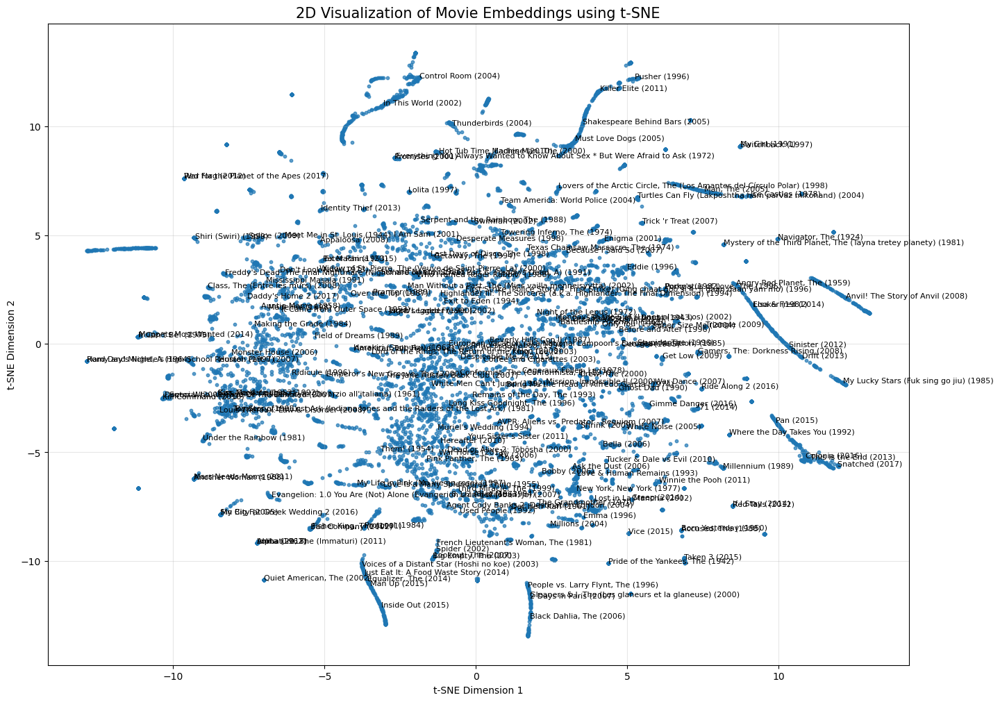

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# 1. 각 영화의 임베딩을 추출
embeddings = []
movie_labels = []

for movie_title in movie_titles_cleaned:
    embedding = get_movie_embedding(skipgram_model, movie_title)
    if embedding is not None:
        embeddings.append(embedding)
        movie_labels.append(movie_title)

# 2. t-SNE로 임베딩 차원 축소
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300)
embeddings_2d = tsne.fit_transform(embeddings)

# 3. 2D 시각화
plt.figure(figsize=(16, 12))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=10, alpha=0.7)

# 일부 영화 제목 표시
for i, label in enumerate(movie_labels):
    if i % 50 == 0:  # 50개마다 하나씩 표시
        plt.text(embeddings_2d[i, 0], embeddings_2d[i, 1], label, fontsize=8)

plt.title("2D Visualization of Movie Embeddings using t-SNE", fontsize=15)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(alpha=0.3)
plt.show()


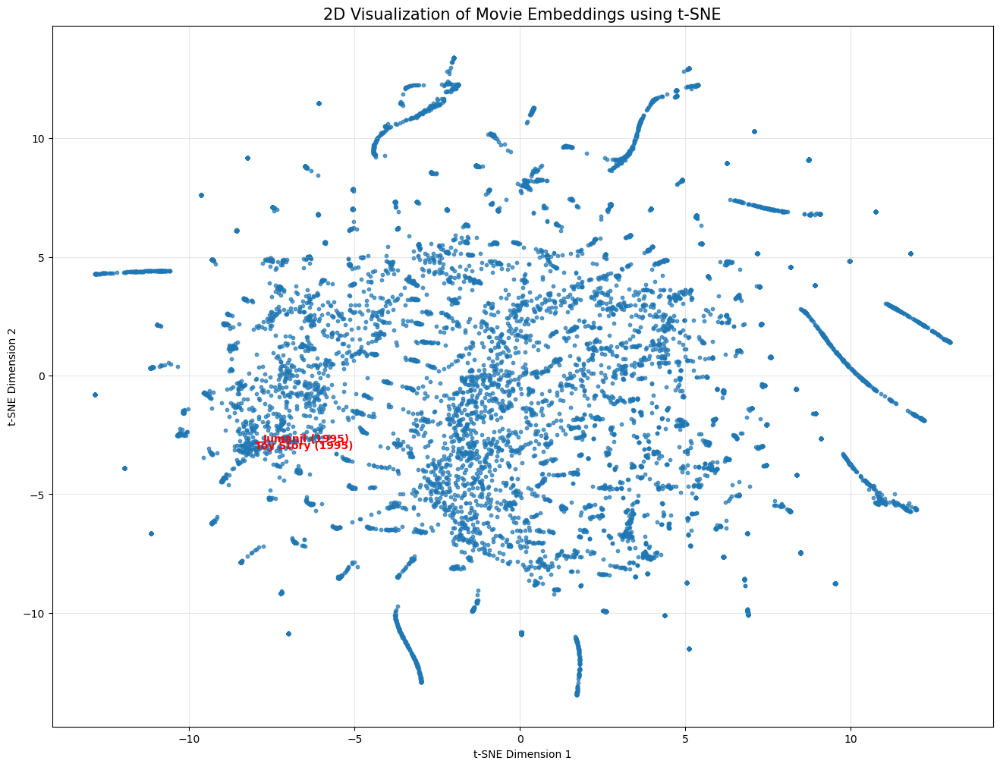

In [24]:
# t-SNE 결과 시각화
plt.figure(figsize=(16, 12))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=10, alpha=0.7)

# "Toy Story (1995)"와 "Jumanji (1995)" 제목만 표시
for i, label in enumerate(movie_labels):
    if label in ["Toy Story (1995)", "Jumanji (1995)"]:
        plt.text(embeddings_2d[i, 0], embeddings_2d[i, 1], label, fontsize=10, color='red', weight='bold')

plt.title("2D Visualization of Movie Embeddings using t-SNE", fontsize=15)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(alpha=0.3)
plt.show()


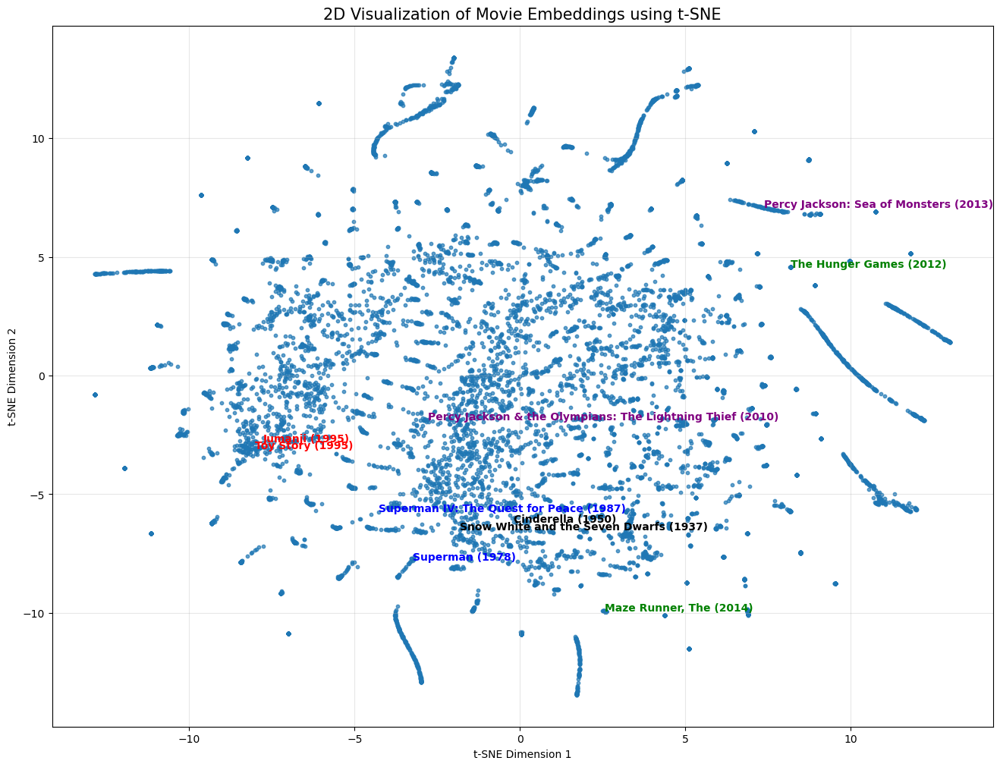

In [25]:
import matplotlib.pyplot as plt

# 강조할 영화 제목 쌍과 색상 설정
highlight_pairs = [
    ("Toy Story (1995)", "Jumanji (1995)", 'red'),
    ("Superman (1978)", "Superman IV: The Quest for Peace (1987)", 'blue'),
    ("The Hunger Games (2012)", "Maze Runner, The (2014)", 'green'),
    ("Percy Jackson & the Olympians: The Lightning Thief (2010)", "Percy Jackson: Sea of Monsters (2013)", 'purple'),
    ("Snow White and the Seven Dwarfs (1937)","Cinderella (1950)", 'black')
]

# t-SNE 결과 시각화
plt.figure(figsize=(16, 12))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=10, alpha=0.7)

# 강조할 영화 쌍에 대해 반복
for movie1, movie2, color in highlight_pairs:
    for movie_title in [movie1, movie2]:
        # 영화 제목에 맞는 인덱스 찾기
        if movie_title in movie_labels:
            idx = movie_labels.index(movie_title)
            plt.text(embeddings_2d[idx, 0], embeddings_2d[idx, 1], movie_title, fontsize=10, color=color, weight='bold')
        else:
            print(f"Warning: '{movie_title}' not found in movie_labels.")

plt.title("2D Visualization of Movie Embeddings using t-SNE", fontsize=15)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(alpha=0.3)
plt.show()


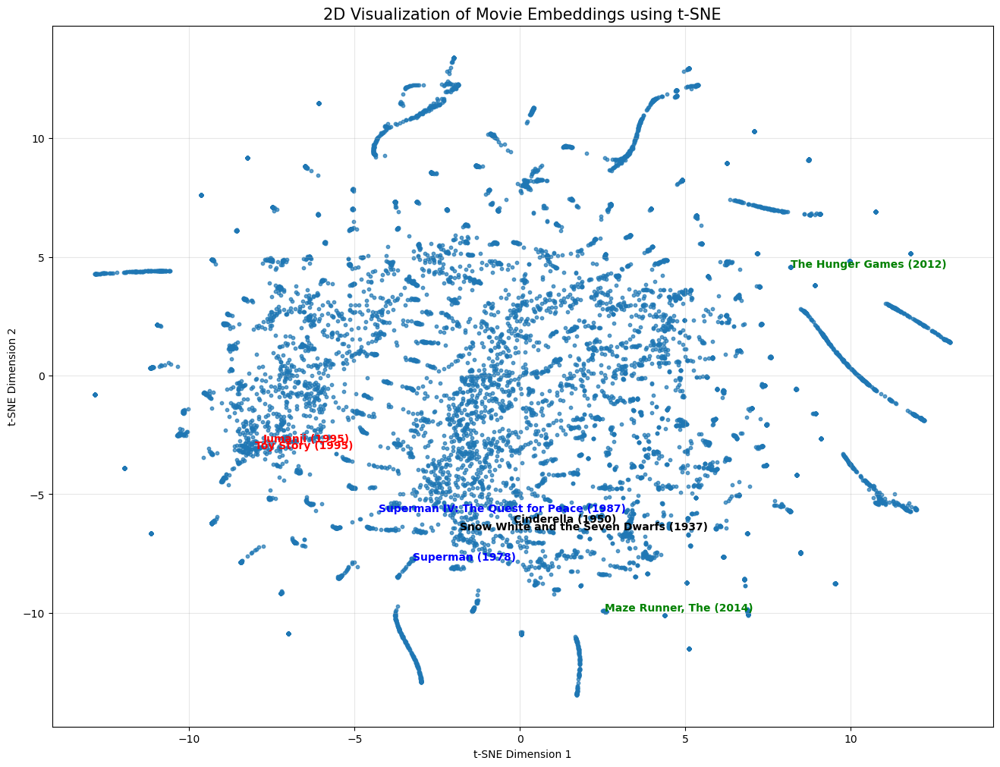

In [26]:
import matplotlib.pyplot as plt

# 강조할 영화 제목 쌍과 색상 설정
highlight_pairs = [
    ("Toy Story (1995)", "Jumanji (1995)", 'red'),
    ("Superman (1978)", "Superman IV: The Quest for Peace (1987)", 'blue'),
    ("The Hunger Games (2012)", "Maze Runner, The (2014)", 'green'),
    ("Snow White and the Seven Dwarfs (1937)","Cinderella (1950)", 'black')
]

# t-SNE 결과 시각화
plt.figure(figsize=(16, 12))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=10, alpha=0.7)

# 강조할 영화 쌍에 대해 반복
for movie1, movie2, color in highlight_pairs:
    for movie_title in [movie1, movie2]:
        # 영화 제목에 맞는 인덱스 찾기
        if movie_title in movie_labels:
            idx = movie_labels.index(movie_title)
            plt.text(embeddings_2d[idx, 0], embeddings_2d[idx, 1], movie_title, fontsize=10, color=color, weight='bold')
        else:
            print(f"Warning: '{movie_title}' not found in movie_labels.")

plt.title("2D Visualization of Movie Embeddings using t-SNE", fontsize=15)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(alpha=0.3)
plt.show()

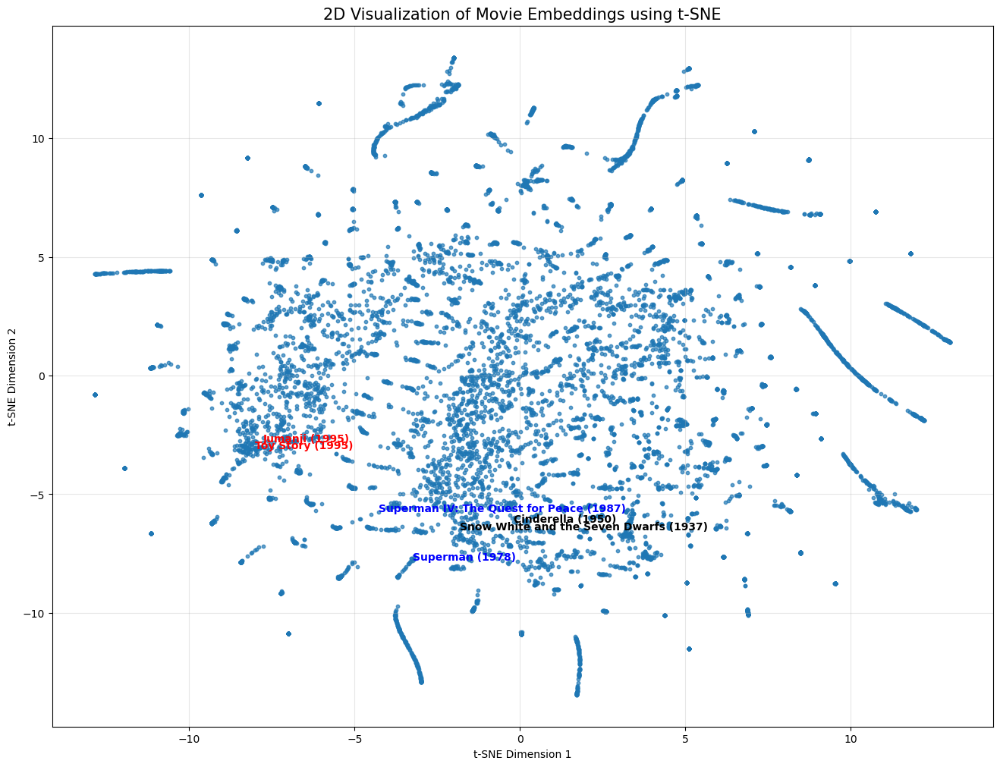

In [31]:
import matplotlib.pyplot as plt

# 강조할 영화 제목 쌍과 색상 설정
highlight_pairs = [
    ("Toy Story (1995)", "Jumanji (1995)", 'red'),
    ("Superman (1978)", "Superman IV: The Quest for Peace (1987)", 'blue'),
    ("Snow White and the Seven Dwarfs (1937)","Cinderella (1950)", 'black')
]

# t-SNE 결과 시각화
plt.figure(figsize=(16, 12))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=10, alpha=0.7)

# 강조할 영화 쌍에 대해 반복
for movie1, movie2, color in highlight_pairs:
    for movie_title in [movie1, movie2]:
        # 영화 제목에 맞는 인덱스 찾기
        if movie_title in movie_labels:
            idx = movie_labels.index(movie_title)
            plt.text(embeddings_2d[idx, 0], embeddings_2d[idx, 1], movie_title, fontsize=10, color=color, weight='bold')
        else:
            print(f"Warning: '{movie_title}' not found in movie_labels.")

plt.title("2D Visualization of Movie Embeddings using t-SNE", fontsize=15)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(alpha=0.3)
plt.show()

In [28]:
# 2. Word2Vec 임베딩 기반으로 영화별 상위 15개 이웃 리스트 생성
embedding_based_neighbors = {}
for movie_title in movie_titles_cleaned:
    # 영화 제목 표준화
    standardized_title = preprocess_movie_title(movie_title)
    if standardized_title in skipgram_model.wv:
        # 가장 가까운 10개의 영화 찾기
        neighbors = skipgram_model.wv.most_similar(standardized_title, topn=20)
        embedding_based_neighbors[movie_title] = [neighbor[0].replace('_', ' ') for neighbor in neighbors]  # 제목 복원
    else:
        embedding_based_neighbors[movie_title] = []


embedding_based_neighbors

{'Toy Story (1995)': ['Broken Arrow 1996',
  'Palmetto 1998',
  'Chasing Amy 1997',
  'Dragonheart 1996',
  'Apollo 13 1995',
  'Twister 1996',
  'Mission: Impossible 1996',
  'Patriot, The 1998',
  "Miller's Crossing 1990",
  'Princess Bride, The 1987',
  'Wallace & Gromit: A Close Shave 1995',
  'Hot Shots! Part Deux 1993',
  'Children of the Revolution 1996',
  'Twelve Monkeys a.k.a. 12 Monkeys 1995',
  'Usual Suspects, The 1995',
  'Big Sleep, The 1946',
  'Ransom 1996',
  'Summer of Sam 1999',
  'Snow White and the Seven Dwarfs 1937',
  'Citizen Ruth 1996'],
 'Jumanji (1995)': ['Interview with the Vampire: The Vampire Chronicles 1994',
  'Taxi Driver 1976',
  'Johnny Mnemonic 1995',
  'Heavy Metal 1981',
  'Pretty Woman 1990',
  'Santa Clause, The 1994',
  'Mask, The 1994',
  'Nine Months 1995',
  'Philadelphia 1993',
  'Vanilla Sky 2001',
  'Ten Commandments, The 1956',
  'Addams Family Values 1993',
  'Creep 2004',
  'Aristocats, The 1970',
  'Alien 1979',
  "City Slickers II: T

In [29]:
# 각 영화에 대해 PMI 이웃과 Word2Vec 이웃을 확인하고 공통 항목 수 계산
matches = []
for pmi_movie, pmi_neighbors in sequences:
    embedding_neighbors = embedding_based_neighbors.get(pmi_movie, [])
    
    # 디버깅용 출력 - 두 목록의 비교
    print(f"PMI neighbors for '{pmi_movie}': {pmi_neighbors}")
    print(f"Word2Vec neighbors for '{pmi_movie}': {embedding_neighbors}")
    
    # PMI와 Word2Vec의 공통 이웃 계산
    common_movies = set(pmi_neighbors) & set(embedding_neighbors)
    matches.append(len(common_movies))  # 공통 이웃 수 저장
    print(f"Common neighbors for '{pmi_movie}': {common_movies}")
    print("-" * 50)

# 평균 일치율 계산
avg_match_count = np.mean(matches)
print(f"Average match count per movie: {avg_match_count:.2f}")

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [30]:
# 연도 표기 형식을 맞추는 함수
def standardize_title_format(movie_title):
    return movie_title.replace('(', '').replace(')', '')

# 3. PMI와 Word2Vec 간 일치율 계산 (표기 형식 일치)
matches = []
for pmi_movie, pmi_neighbors in sequences:
    # PMI 기반 이웃 리스트의 형식 변경
    standardized_pmi_neighbors = [standardize_title_format(title) for title in pmi_neighbors]
    # Word2Vec 이웃 가져오기
    embedding_neighbors = embedding_based_neighbors.get(pmi_movie, [])
    # 공통 이웃 찾기
    common_movies = set(standardized_pmi_neighbors) & set(embedding_neighbors)
    matches.append(len(common_movies))

# 4. 평균 일치율 계산
avg_match_count = np.mean(matches)
print(f"Average match count per movie: {avg_match_count:.2f}")


Average match count per movie: 3.19
